## Курсовой проект для курса "Python для Data Science"

**Задание:** Используя данные из обучающего датасета (train.csv), построить модель для предсказания цен на недвижимость (квартиры).
С помощью полученной модели, предсказать цены для квартир из тестового датасета (test.csv).

**Целевая переменная:** Price

**Метрика качества:** R2 - коэффициент детерминации (sklearn.metrics.r2_score)

**Описание датасета:**
<ul>
    <li>Id - идентификационный номер квартиры</li>
    <li>DistrictId - идентификационный номер района</li>
    <li>Rooms - количество комнат</li>
    <li>Square - площадь</li>
    <li>LifeSquare - жилая площадь    </li>
    <li>KitchenSquare - площадь кухни    </li>
    <li>Floor - этаж    </li>
    <li>HouseFloor - количество этажей в доме    </li>
    <li>HouseYear - год постройки дома    </li>
    <li>Ecology_1, Ecology_2, Ecology_3 - экологические показатели местности    </li>
    <li>Social_1, Social_2, Social_3 - социальные показатели местности    </li>
    <li>Healthcare_1, Helthcare_2 - показатели местности, связанные с охраной здоровья </li>
    <li>Shops_1, Shops_2 - показатели, связанные с наличием магазинов, торговых центров </li>
    <li>Price - цена квартиры </li>
    </ul>

## Содержание
* [Подготовка датасет, оптимизация](#prep)
* [Цель и общее описание модели](#general)
* [1. Распределение целевой переменной](#target)
* [2. Анализ признаков и корректировка данных](#features)
    * [2.1 Количественные признаки](#num_features)
    * [2.2 Категориальные/бинарные признаки](#cat_features)
    * [2.3 Новые признаки](#new_features)
    * [2.4 Матрица корреляций](#corr)
* [3. Анализ зависимости таргета от фичей](#target_features)
    * [3.1 Количественные признаки](#num_features_target)
    * [3.2 Категориальные / бинарные признаки](#cat_bin_features)
* [4. Моделирование](#model)
    * [4.1 Отбор факторов](#model_factor)
    * [4.2 Стандартизация](#model_standart)    
    * [4.3 Разбиение на train/test](#model_devide)
    * [4.4 Линейная регрессия](#model_lr)
    * [4.5 Random Forest](#rf)
    * [4.6 Gradient Boosting (regress)](#boost)
    * [4.7 LGBMRegressor](#LGBMR)
    * [4.8 XGBRegressor](#XGBR)
    * [4.9 Выбор лучшей модели](#choose)
* [5. Прогнозирование](#estimate)
    * [5.1 Обработка данных](#est_ev)
    * [5.2 Применение модели и сохранение](#est_save)

In [1]:
import numpy as np
import pandas as pd
import pickle   # сохранение модели

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree, DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.metrics import r2_score as r2, mean_squared_error as mse, roc_auc_score, recall_score

from sklearn import svm
from sklearn.svm import SVR

import statsmodels.api as sm
import statsmodels.formula.api as smf

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from scipy.stats import norm
from scipy import stats

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import warnings
warnings.filterwarnings('ignore')

import matplotlib.image as img
from scipy import stats
from IPython.display import Image

# Подготовка dataset, оптимизация<a class='anchor' id='prep'>

In [2]:
#Пути к директориям
DATASET_PATH = 'train.csv'
PREPARED_DATASET_PATH = 'train_prepared.csv'

In [3]:
test = pd.read_csv('test.csv')

In [4]:
#Данные
data_row = pd.read_csv(DATASET_PATH, sep=',')
data_row.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,NaN,0,11,B,184966.930730
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
3,5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644


In [5]:
#оптимизация памяти

In [6]:
def reduce_mem_usage(data_row):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = data_row.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is: {:.2f} MB'.format(start_mem))
    
    for col in data_row.columns:
        col_type = data_row[col].dtype
        
        if col_type != object:
            c_min = data_row[col].min()
            c_max = data_row[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    data_row[col] = data_row[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    data_row[col] = data_row[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    data_row[col] = data_row[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    data_row[col] = data_row[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    data_row[col] = data_row[col].astype(np.float32)
                else:
                    data_row[col] = data_row[col].astype(np.float64)
        else:
            data_row[col] = data_row[col].astype('category')

    end_mem = data_row.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return data_row

In [7]:
data_row.dtypes

Id                 int64
DistrictId         int64
Rooms            float64
Square           float64
LifeSquare       float64
KitchenSquare    float64
Floor              int64
HouseFloor       float64
HouseYear          int64
Ecology_1        float64
Ecology_2         object
Ecology_3         object
Social_1           int64
Social_2           int64
Social_3           int64
Healthcare_1     float64
Helthcare_2        int64
Shops_1            int64
Shops_2           object
Price            float64
dtype: object

In [8]:
data_row = reduce_mem_usage(data_row)

Memory usage of dataframe is: 1.53 MB
Memory usage after optimization is: 0.49 MB
Decreased by 68.1%


In [9]:
#запись результатов моделей
results_all = {}

# Цель и общее описание модели<a class='anchor' id='general'>

Целью работы является построение модели ценообразования на квартиры на основе предоставленной первичной (тренировочной) базы данных. 
Далее, построенная модель будет применена к предоставленным фактическим (тестовым) данным для прогнозирования цены. 
Инструментом моделирования служат различные модели машинного обучения:
 - линейная регрессия (в т.ч. с регуляризацией если будет необходимо (при высокой автокорреляции));
 - дерево решений;
 - случайный лес;
 - gradient Boosting;
 - LGBMRegressor;
 - XGBRegressor. 

Будут рассчитаны различные метрики качества моделей (основная - R2) и выбрана наиболее оптимальная, на основании которой будут спрогнозированы фактические (тестовые) цены по предоставленым параметрам.

# 1. Распределение целевой переменной<a class='anchor' id='target'>

In [10]:
#данные медианы, моды, среднего по ценам на квартиры, проверка на пропуски
data_median = data_row['Price'].median()
data_mode = data_row['Price'].mode()[0]
data_mean = round(data_row['Price'].mean(), 2)
data_row['Price'].isnull().astype(np.int).sum()
print('МИН', data_row['Price'].min())
print('МАКС', data_row['Price'].max())
print('МЕДИАНА', data_row['Price'].median())

МИН 59174.77734375
МАКС 633233.4375
МЕДИАНА 192269.65625


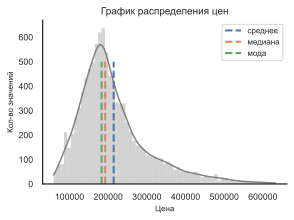

In [11]:
#график распределения цен
sns.set(font_scale=0.8, style='white')
sns.displot(data_row['Price'], kde=True, color='grey', alpha = 0.35, lw=0, height=3, aspect=1.4)
y = np.linspace(0, 500, 10)
plt.plot([data_mean] * 10, y, label='среднее',  linewidth=2, linestyle='--')
plt.plot([data_median] * 10, y, label='медиана',  linewidth=2, linestyle='--')
plt.plot([data_mode] * 10, y, label='мода',  linewidth=2, linestyle='--')
plt.title('График распределения цен', fontsize=10)
plt.xlabel('Цена', fontsize=8)
plt.ylabel('Кол-во значений', fontsize=8)
plt.legend(fontsize=8)
plt.show()

В целом распределение цен близко к логнормальному, заметный выброс есть в левом хвосте, в правом хвосте - многочисленные, 
но менее значимые. Медиана, мода, среднее - близки. Пропусков в значениях цен нет.

# 2. Анализ признаков и корректировка данных<a class='anchor' id='features'>

### 2.1 Количественные признаки<a class='anchor' id='num_features'>

In [12]:
data_num_features = data_row.select_dtypes(include=['int8', 'int16', 'int32', 'float32'])
data_num_features.drop(['Price', 'Id'], 1, inplace=True)
data_num_features.describe()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1
count,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000
mean,50.400800,1.890500,56.315712,37.199596,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904419,1.319500,4.231300
std,43.587592,0.839523,21.058718,86.241112,28.561113,5.241148,6.776192,2.005003e+05,0.119026,17.532614,4006.799803,23.831875,1021.518982,1.493601,4.806341
min,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,1.000000,41.774879,22.769833,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000
50%,36.000000,2.000000,52.513309,32.781261,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000
75%,75.000000,2.000000,65.900627,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000
max,209.000000,19.000000,641.065186,7480.592285,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000


In [13]:
mean_data_f = np.mean(data_num_features).round(1)
min_data_f = np.min(data_num_features, axis = 0).round(1)
max_data_f = np.max(data_num_features, axis = 0).round(1)
null_data_f = data_num_features.isnull().astype(np.int).sum()

In [14]:
keys_data_f = mean_data_f.keys()
np.column_stack([keys_data_f, mean_data_f, min_data_f, max_data_f, null_data_f])

array([['DistrictId', 50.4, 0.0, 209.0, 0],
       ['Rooms', 1.9, 0.0, 19.0, 0],
       ['Square', 56.3, 1.1, 641.1, 0],
       ['LifeSquare', 37.2, 0.4, 7480.6, 2113],
       ['KitchenSquare', 6.3, 0.0, 2014.0, 0],
       ['Floor', 8.5, 1.0, 42.0, 0],
       ['HouseFloor', 12.6, 0.0, 117.0, 0],
       ['HouseYear', 3990.2, 1910.0, 20052011.0, 0],
       ['Ecology_1', 0.1, 0.0, 0.5, 0],
       ['Social_1', 24.7, 0.0, 74.0, 0],
       ['Social_2', 5352.2, 168.0, 19083.0, 0],
       ['Social_3', 8.0, 0.0, 141.0, 0],
       ['Healthcare_1', 1142.9, 0.0, 4849.0, 4798],
       ['Helthcare_2', 1.3, 0.0, 6.0, 0],
       ['Shops_1', 4.2, 0.0, 23.0, 0]], dtype=object)

**Предварительный план корректировки данных**

DistrictId: минимальное значение 0 (таких значений - 48 - (data_row['DistrictId'] == 0).sum()).

Rooms: минимальное значение 0 (ноль комнат - ошибка в данных? всего 4 штуки). Заполнить по псевдокоду: показатель = среднее отношение квадратуры на кол-во комнат, где нулевые значения комнат, менем кол-во компант = показатель * квадратуру (округл 0). Проверить максимальное кол-во комнат.

Square: средняя  средняя 56 кв.м., минимальная 1 - кв.м. максимум - 641 кв.м., возможно надо исключать площади менее 10 кв.м.?, проверить максимальные площади.

**LifeSquare**: средняя 37 кв.м., мин 0.37, макс 7480 кв.м. , есть 2113 штук пустых. Надо заполнить пустые, проверить минимальные и максимальные на случаные выбросы, отношение общей к жилой (жилай не может быть больше общей). 

KitchenSquare: минимальная 0, максимальная 2014 - аналогично жилой проверить и скорректировать, также жилая и кухня не могут быть в сумме больше общей, а если они меньше, то добавить новый столбец с неучтенной площадью.

Floor: в среднем 8,5, мин 1, макс 42, пропусков нет

HouseFloor: минимальный - 0, попусков нет, проверить максимальные.

HouseYear: минимум 1910 год, максимум - 20052011 - явно ошибка в данных, надо скорректировать.

Ecology_1: распределен от 0 до 0,52 в основном около 0

Social_1: распределен от 0 до 74 - убывающая лестница

Social_2: от 163 до 19083, в основном до 10000 в максимуме - выброс, надо проверять эти значения.

Social_3: от 0 до 141, в основном около 0, большие значения - выбросы. Надо понять, значим ли фактор или от него можно вообще отказаться.

**Healthcare_1**: от 0 до 4849, очень много пустых значений (4798 пустых), но в принципе распределено логнормально, необходимо заполнить отсутствующие медианным или средним - требует доп анализа.

Helthcare_2: от 0 до 6 пропусков нет, в целом не требует доп обработки.

Shops_1: от 0 до 23 пропусков нет, в целом не требует доп обработки.

In [15]:
class DataPreprocessing:
    """Подготовка исходных данных"""
   
    def transform(self, X):
       
        
        """Трансформация данных"""
        # Общая площадь
        X['Square'][X['Square'] < 10] = X['Square'][X['Square'] < 10]*10
        X.loc[(X['Square'] > 300) & (X['Rooms'] < 4), 'Square'] = X.loc[(X['Square'] > 300) & (X['Rooms'] < 4), 'Square'] / 10    
        X['Square'].fillna(X['Square'].median(), inplace=True)
        X['Square'] = round(X['Square'], 1)
        
        # Жилая площадь
        X['LifeSquare'][X['LifeSquare'] > X['Square']] = X['Square']
        sign_lifeSq = X['Square'][X['LifeSquare'] > 0].sum() / X['LifeSquare'][X['LifeSquare'] > 0].sum()
        X['LifeSquare'].fillna(X['Square'] / sign_lifeSq, inplace=True)
        X['LifeSquare'][X['LifeSquare'] < 10] = X['Square'] / sign_lifeSq
        X['LifeSquare'] = round(X['LifeSquare'], 1)
        
        # Площадь кухни + добавить прочую жилую
        X['KitchenSquare'][X['Square']-X['LifeSquare'] < X['KitchenSquare']] = X['Square']-X['LifeSquare']
        X['KitchenSquare'] = round(X['KitchenSquare'],1)
        X['KitchenSquare'][X['Square'] - X['LifeSquare'] - X['KitchenSquare'] < 0] = 0
        X['KitchenSquare'].fillna(X['Square'] - X['LifeSquare'], inplace=True)
        
        An_Life_Sq = X['Square'][X['Square']-X['LifeSquare'] - X['KitchenSquare']>-0.001] - X['LifeSquare'][X['Square']-X['LifeSquare'] - X['KitchenSquare']>-0.001] - X['KitchenSquare'][X['Square']-X['LifeSquare'] - X['KitchenSquare']>-0.001]
        X['An_Life_Sq'] = An_Life_Sq
    
        # Кол-во комнат
        sign_RoomSq = X['Square'][(X['Rooms'] > 0) & (X['Rooms'] < 5)].sum() / X['Rooms'][(X['Rooms'] > 0) & (X['Rooms'] < 5)].sum()
        X['Rooms'][X['Rooms'] == 0] = np.ceil(X['Square'] / sign_RoomSq)
        X['Rooms'][(X['Square'] / X['Rooms'] < 8) | ((X['Rooms']>4) & (X['Square'] < 90))] = np.ceil(X['Square'] / sign_RoomSq)
        X['Rooms'].fillna(np.ceil(X['Square'] / sign_RoomSq), inplace=True)
        
        # Год постройки (в изначальных данных всего 2 не корректных, однако неизвестно, что будет в реальных)
        X['HouseYear'].fillna(X['HouseYear'].median(), inplace=True)
        X['HouseYear'][X['HouseYear'] > 2020] = X['HouseYear'][X['HouseYear'] < 2020].median()
            
        # Этажность
        Floor_corr = X['HouseFloor'][X['HouseFloor'] - X['Floor'] < 0]
        X['Floor_corr'] = Floor_corr
        X['Floor_corr'].fillna(X['Floor'], inplace=True)
    
        X['HouseFloor'][X['HouseFloor'] - X['Floor'] < 0] = X['Floor'][X['HouseFloor'] - X['Floor'] < 0]
        X['Floor'] = X['Floor_corr']
    
        X['Floor'].fillna(X['Floor'].median(), inplace=True)
        X['HouseFloor'].fillna(X['HouseFloor'].median(), inplace=True)
        
        # Корректируем прочее
        X['Healthcare_1'].fillna(X['Healthcare_1'].median(), inplace=True)
        X['DistrictId'].fillna(X['DistrictId'].median(), inplace=True)
        X['Ecology_1'].fillna(X['Ecology_1'].mode(), inplace=True)
        X['Social_1'].fillna(X['Social_1'].mode(), inplace=True)
        X['Social_2'].fillna(X['Social_2'].mode(), inplace=True)
        X['Social_3'].fillna(X['Social_3'].mode(), inplace=True)
        X['Helthcare_2'].fillna(X['Helthcare_2'].mode(), inplace=True)
        X['Shops_1'].fillna(X['Shops_1'].mode(), inplace=True)
        
        return X


In [16]:
data_row = DataPreprocessing().transform(data_row)

In [17]:
data_row.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price,An_Life_Sq,Floor_corr
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.888300,56.206573,37.339611,5.374429,7.700400,13.435700,1984.863800,0.118858,24.687000,5352.157400,8.039200,1026.358887,1.319500,4.231300,214139.218750,13.492635,7.700400
std,4859.01902,43.587592,0.812468,19.080553,16.179100,4.062904,5.304036,6.094035,18.409979,0.119026,17.532614,4006.799803,23.831875,746.645447,1.493601,4.806341,92872.304688,8.305923,5.304036
min,0.00000,0.000000,1.000000,11.400000,7.400000,0.000000,0.000000,1.000000,1910.000000,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.777344,0.000000,0.000000
25%,4169.50000,20.000000,1.000000,41.799999,25.700001,1.000000,4.000000,9.000000,1974.000000,0.017647,6.000000,1564.000000,0.000000,830.000000,0.000000,1.000000,153872.628906,8.699999,4.000000
50%,8394.50000,36.000000,2.000000,52.500000,33.900002,6.000000,7.000000,14.000000,1977.000000,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.648438,12.800001,7.000000
75%,12592.50000,75.000000,2.000000,65.900002,45.200001,8.000000,11.000000,17.000000,2001.000000,0.195781,36.000000,7227.000000,5.000000,990.000000,2.000000,6.000000,249135.460938,18.100002,11.000000
max,16798.00000,209.000000,8.000000,275.600006,233.899994,42.000000,42.000000,117.000000,2020.000000,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.437500,70.099991,42.000000


### 2.2 Категориальные / бинарные признаки<a class='anchor' id='cat_features'>

(array([9175.,    0.,  825.]),
 array([0.        , 0.33333333, 0.66666667, 1.        ]),
 <BarContainer object of 3 artists>)

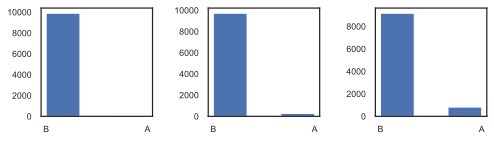

In [18]:
counts_ec2 = data_row['Ecology_2']
counts_ec3 = data_row['Ecology_3']
counts_sh2 = data_row['Shops_2']

fig, ax = plt.subplots(nrows=1, ncols=3)
fig.subplots_adjust(wspace=0.5)
fig.set_size_inches(8, 2)

ax[0].hist(counts_ec2, bins=3)
ax[1].hist(counts_ec3, bins=3)
ax[2].hist(counts_sh2, bins=3)

поскольку в этих признаках только две категории, их можно рассматривать и как бинарные

In [19]:
#замена на бинарные 0, 1

In [20]:
def fix_binar(X):
    binary_to_numbers = {'A': 0, 'B': 1}
    X['Ecology_2'] = X['Ecology_2'].replace(binary_to_numbers)
    X['Ecology_3'] = X['Ecology_3'].replace(binary_to_numbers)
    X['Shops_2'] = X['Shops_2'].replace(binary_to_numbers)
    return X  

In [21]:
data_row = fix_binar(data_row)

In [22]:
data_row[['Ecology_2', 'Ecology_3', 'Shops_2']].head()

,Ecology_2,Ecology_3,Shops_2
0,1,1,1
1,1,1,1
2,1,1,1
3,1,1,1
4,1,1,1


### 2.3 Новые признаки<a class='anchor' id='new_features'>

Уже был введен новый признак An_Life_Sq - прочая жилая площадь (как разница между Общей, жилой и кухней) и заменены категориальные на бинарные (0 и 1).

In [23]:
#Интервал возраста домов
def year_to_cat(X):

    X['year_cat'] = 0

    X.loc[X['HouseYear'] <= 1940, 'year_cat'] = 1
    X.loc[(X['HouseYear'] > 1940) & (X['HouseYear'] <= 1955), 'year_cat'] = 2
    X.loc[(X['HouseYear'] > 1955) & (X['HouseYear'] <= 1965), 'year_cat'] = 3
    X.loc[(X['HouseYear'] > 1965) & (X['HouseYear'] <= 1975), 'year_cat'] = 4
    X.loc[(X['HouseYear'] > 1975) & (X['HouseYear'] <= 1985), 'year_cat'] = 5
    X.loc[(X['HouseYear'] > 1985) & (X['HouseYear'] <= 1995), 'year_cat'] = 6    
    X.loc[(X['HouseYear'] > 1995) & (X['HouseYear'] <= 2005), 'year_cat'] = 7
    X.loc[(X['HouseYear'] > 2005) & (X['HouseYear'] <= 2015), 'year_cat'] = 8
    X.loc[(X['HouseYear'] > 2015), 'year_cat'] = 9

    return X

data_row = year_to_cat(data_row)

In [24]:
#диапазоны площадей
def av_sr(X):

    X['av_sr'] = 0

    X.loc[X['Square'] <= 30, 'av_sr'] = 1
    X.loc[(X['Square'] > 30) & (X['Square'] <= 50), 'av_sr'] = 2
    X.loc[(X['Square'] > 50) & (X['Square'] <= 70), 'av_sr'] = 3
    X.loc[(X['Square'] > 70) & (X['Square'] <= 90), 'av_sr'] = 4
    X.loc[(X['Square'] > 90), 'av_sr'] = 5

    return X
data_row = av_sr(data_row)

In [25]:
def new_features(X, data_row_train = data_row):
    #показатель отношения этажа квартиры к общей этажности дома
    ProcFloor = pd.DataFrame({'ProcFloor': round(X['Floor'] / X['HouseFloor'], 2)})
    X['ProcFloor'] = ProcFloor
    
    #сколько домов в каждом округе (зависимость цены от кол-ва домов в округе)
    district_size = X['DistrictId'].value_counts().reset_index()\
                    .rename(columns={'index':'DistrictId', 'DistrictId':'DistrictSize'})
    X = X.merge(district_size, on='DistrictId', how='left')
    
    #медианная цена за кв.м. в привязке к диапазону площади
    med_price_by_Sq = data_row_train.groupby(['av_sr'], as_index=False).agg({'Price':'median'})\
                            .rename(columns={'Price':'med_price_by_Sq'})
    X = X.merge(med_price_by_Sq, on=['av_sr'], how='left')
    X['med_price_by_Sq'] = X['med_price_by_Sq'] / X['Square']
    
    
    #медианная цена по дистрикту 
    med_price_by_Distr = data_row_train.groupby(['DistrictId'], as_index=False).agg({'Price':'median'})\
                            .rename(columns={'Price':'med_price_by_Distr'})
    X = X.merge(med_price_by_Distr, on=['DistrictId'], how='left')
    X['med_price_by_Distr'] = X['med_price_by_Distr'] / X['Square']

    #Средняя за кв.м.
    av_price_by_sq = data_row_train['Price']/data_row_train['Square']
    X['av_price_by_sq'] = av_price_by_sq
    
    #по средней площади 1 комнаты  
    room_avg = pd.DataFrame({'room_avg': round(X['Square'] / X['Rooms'], 2)})
    X['room_avg'] = room_avg    
    
    
    return X

In [26]:
data_row = new_features(data_row)

In [27]:
data_row.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,An_Life_Sq,Floor_corr,year_cat,av_sr,ProcFloor,DistrictSize,med_price_by_Sq,med_price_by_Distr,av_price_by_sq,room_avg
0,14038,35,2.0,48.000000,29.400000,6.0,7.0,9.0,1969,0.089040,...,1.260000e+01,7.0,4,2,0.78,22,3481.962646,4241.716797,3853.477783,24.000000
1,15053,41,3.0,65.699997,40.000000,8.0,7.0,9.0,1978,0.000070,...,1.770000e+01,7.0,5,3,0.78,87,3248.494873,3206.923096,4566.354004,21.900000
2,4765,53,2.0,44.900002,29.200001,0.0,8.0,12.0,1968,0.049637,...,1.570000e+01,8.0,4,2,0.67,174,3722.365234,5478.369629,4920.398438,22.450001
3,5809,58,2.0,53.400002,52.700001,0.7,8.0,17.0,1977,0.437885,...,7.748604e-07,8.0,5,3,0.47,179,3996.743408,2838.162842,3288.693359,26.700001
4,10783,99,1.0,39.599998,23.799999,7.0,11.0,12.0,1976,0.012339,...,8.799999e+00,11.0,5,2,0.92,97,4220.561035,4515.888184,3793.599365,39.599998


### 2.4 Матрица корреляций<a class='anchor' id='corr'>

<AxesSubplot:>

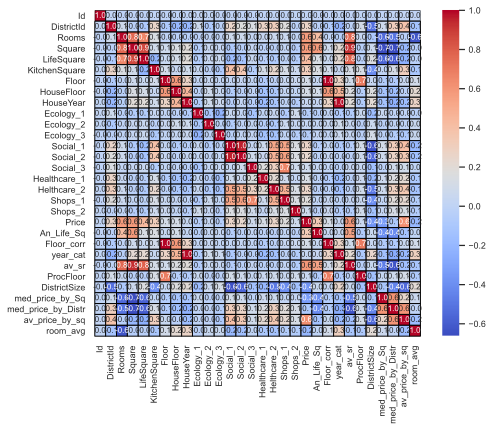

In [28]:
plt.figure(figsize=(8, 6))
sns.heatmap(data_row.corr(), cmap= 'coolwarm', linewidths=1, fmt='.1f', annot=True, linecolor='black', square=True, annot_kws={'size':8})
#plt.show()

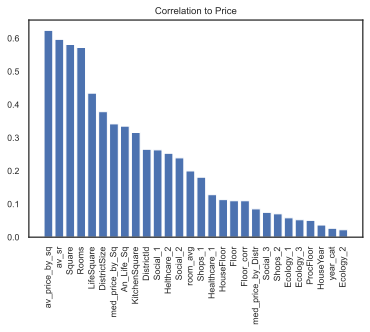

In [29]:
corrmat = data_row.loc[:, data_row.columns != 'Id'].corrwith(
    data_row['Price']).abs().sort_values(ascending=False)[1:]
plt.bar(corrmat.index, corrmat.values)
plt.title('Correlation to Price')
plt.xticks(rotation='vertical')
plt.show()

Есть корреляция между площадью квартир и кол-вом комнат (логично)
Есть не высокая связь между годом постройки и этажностью (что в принципе тоже логично, более современые дома - более этажные)
Высокая зависимость между социальными показателями 1 и 2 группы, а также между соц показателями и показателями здоровья второй группы и магазинов 1. Без расшифровок, что означают каждые показатели, вывод сделать невозможно.

Относительно целевой переменной выявлена зависимость с количеством комнат и площадью.

# 3. Анализ зависимости таргета от признаков<a class='anchor' id='target_features'>

## 3.1 Количественные признаки<a class='anchor' id='num_features_target'>

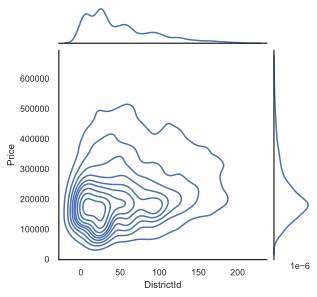

In [30]:
grid = sns.jointplot(data_row['DistrictId'], data_row['Price'], kind='kde')
grid.fig.set_figwidth(4)
grid.fig.set_figheight(4)

plt.show()

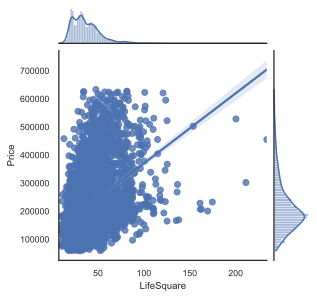

In [31]:
grid = sns.jointplot(data_row['LifeSquare'], data_row['Price'], kind='reg')
grid.fig.set_figwidth(4)
grid.fig.set_figheight(4)

plt.show()

In [32]:
#проверка на выбросы
#plt.figure(figsize=(6, 3))

#sns.boxplot(data_row['Healthcare_1'], whis=1.5)

#plt.xlabel('Healthcare_1')
#plt.show()

В целом на графиках отражена картина, соответствующая корреляцинной матрицы, построенной выше. Также были проверены итоговые получившиеся выбросы: в целом данные стали корректными

## 3.2 Категориальные / бинарные признаки<a class='anchor' id='cat_bin_features'>

In [33]:
#plt.figure(figsize=(8, 6))

#plt.subplot(3, 1, 1)
#plt.scatter(data_row['Price'], data_row['Ecology_2'])

#plt.subplot(3, 1, 2)
#sns.boxplot(data_row['Price'], data_row['Ecology_3'], whis=1.5)

#plt.subplot(3, 1, 3)
#sns.violinplot(data_row['Price'], data_row['Shops_2'])

#plt.show()

Поскольку не значительное количество домов имеют категорию А по Ecology_2, Ecology_3 и Shops_2 (здесь количество чуть выше), то распределение в категории B по ценам имеет большие выбросы. В целом категории А и B по магазинам относительно цен схожи, относительно показателя экологии 3 квартиры в категории А - чуть дороже, но в категории B есть очень много выбросов в дорогой сегмент квартир.

# 4. Моделирование<a class='anchor' id='model'>

## 4.1 Отбор факторов<a class='anchor' id='model_factor'>

In [34]:
data_row.columns.tolist()

['Id',
 'DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'Price',
 'An_Life_Sq',
 'Floor_corr',
 'year_cat',
 'av_sr',
 'ProcFloor',
 'DistrictSize',
 'med_price_by_Sq',
 'med_price_by_Distr',
 'av_price_by_sq',
 'room_avg']

После доп анализа принято решение исключить параметры с выявленым количеством больших ошибок в первичных данных ПРИ ЭТОМ которые имеют автокорреляцию с основными показателями (например, жилая площадь и общая - в целом зависимости должны быть идентичны, при продажах смотрят в основном на общую площадь). Также были оставлены показатели средней цены за кв.м. - в данном случае (при анализе недвижимости) - это один из самых важных показателей: первый вопрос, который всегда задается при оценке недвижимости - а сколько стоит квадратный метр? 

In [35]:
feature_names = ['Rooms', 'Square', 'KitchenSquare','Floor', 'ProcFloor', 'Ecology_1', 'Social_1', 'Helthcare_2', 'Shops_1',
                  'year_cat', 'DistrictSize', 'med_price_by_Sq', 'av_price_by_sq', 'room_avg']

target_name = 'Price'

## 4.2 Стандартизация<a class='anchor' id='model_standart'>

In [36]:
def prep_stand_data(X):
    feature_names_st = X[feature_names].columns.tolist()
    scaler = StandardScaler()
    stand_features = scaler.fit_transform(X[feature_names_st])
    X[feature_names_st] = pd.DataFrame(stand_features, columns=feature_names_st)

    return X  

In [37]:
data_row = prep_stand_data(data_row)

In [38]:
data_row.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,An_Life_Sq,Floor_corr,year_cat,av_sr,ProcFloor,DistrictSize,med_price_by_Sq,med_price_by_Distr,av_price_by_sq,room_avg
0,14038,35,0.137491,-0.430125,29.400000,0.153978,-0.132056,9.0,1969,-0.250529,...,1.260000e+01,7.0,-0.839876,2,0.681530,-0.819047,-0.719832,4241.716797,-0.033588,-0.848097
1,15053,41,1.368384,0.497568,40.000000,0.646257,-0.132056,9.0,1978,-0.998053,...,1.770000e+01,7.0,-0.293117,3,0.681530,-0.577393,-1.184825,3206.923096,0.525331,-1.059066
2,4765,53,0.137491,-0.592603,29.200001,-1.322861,0.056488,12.0,1968,-0.581588,...,1.570000e+01,8.0,-0.839876,2,0.306739,-0.253948,-0.241028,5478.369629,0.802914,-1.003812
3,5809,58,0.137491,-0.147100,52.700001,-1.150563,0.056488,17.0,1977,2.680470,...,7.748604e-07,8.0,-0.293117,3,-0.374699,-0.235359,0.305445,2838.162842,-0.476398,-0.576851
4,10783,99,-1.093403,-0.870387,23.799999,0.400117,0.622121,12.0,1976,-0.894969,...,8.799999e+00,11.0,-0.293117,2,1.158537,-0.540215,0.751217,4515.888184,-0.080534,0.719102


In [39]:
#сохранение датасета
data_row.to_csv(PREPARED_DATASET_PATH, index=False, encoding='utf-8', sep=',')

## 4.3 Разбиение на train/test<a class='anchor' id='model_devide'>

In [40]:
X = data_row[feature_names]
y = data_row[target_name]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, shuffle=True, random_state=42)

In [41]:
def evaluate_preds(true_values, pred_values):
    """Оценка качества модели и график preds vs true"""
    r2_m = round(r2(true_values, pred_values), 3)
    RMSE_m = round(np.sqrt(mse(true_values, pred_values)), 3)
    MSE_m = round(mse(true_values, pred_values), 3)
    print("R2:\t" + str(r2_m) + "\n" +
          "RMSE:\t" + str(RMSE_m) + "\n" +
          "MSE:\t" + str(MSE_m)
         )
    
    plt.figure(figsize=(5,5))
    
    sns.scatterplot(x=pred_values, y=true_values)
    plt.plot([0, 700000], [0, 700000], linestyle='--', color='black')  # диагональ, где true_values = pred_values
    
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('True vs Predicted values')
    
    plt.show()

## 4.4 Линейная регрессия<a class='anchor' id='model_lr'>

R2:	0.933
RMSE:	24100.872
MSE:	580852049.968


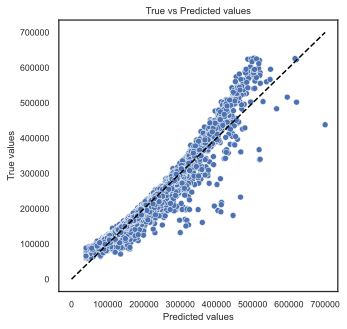

In [42]:
lr_model = LinearRegression()
lr_model.fit(X_train.loc[:, feature_names], y_train)

y_train_preds = lr_model.predict(X_train.loc[:, feature_names])
y_train_preds = np.clip(y_train_preds, a_min=40000, a_max=700000)

evaluate_preds(y_train, y_train_preds)

R2:	0.892
RMSE:	30472.565
MSE:	928577191.21


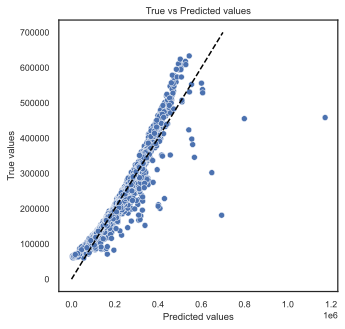

In [43]:
y_test_preds = lr_model.predict(X_test.loc[:, feature_names])

evaluate_preds(y_test, y_test_preds)

results_all['Линейная регрессия'] = [round(r2(y_test, y_test_preds), 3), round(np.sqrt(mse(y_test, y_test_preds)), 0)]

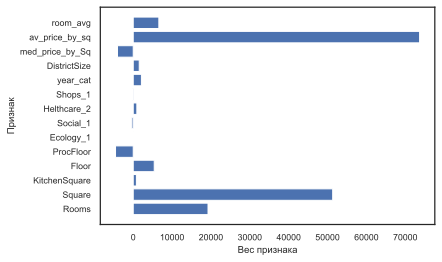

In [44]:
plt.barh(feature_names, lr_model.coef_.flatten())

plt.xlabel("Вес признака")
plt.ylabel("Признак")

plt.show()

In [45]:
#в целом модель имеет хорошие показатели и веса отражают логически верные зависимости.
#построим "классическую" линейную регрессию с помощью интструмента OLS для более детального изучения

In [46]:
e = np.random.normal(size=len(y_train))

In [47]:
X_train = sm.add_constant(X_train)
y_train = y_train + e

In [48]:
lr_model_ols = sm.OLS(y_train, X_train)
results = lr_model_ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     6424.
Date:                Thu, 15 Apr 2021   Prob (F-statistic):               0.00
Time:                        18:32:39   Log-Likelihood:                -77203.
No. Observations:                6700   AIC:                         1.544e+05
Df Residuals:                    6685   BIC:                         1.545e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            2.144e+05    299.024    7

R2 около 90%, при медианной цене 200 тыс, ошибка  30-35 тыс - это хорошие показатели модели. 

Статистика Дарбина-Уотсона около 2, значит автокорреляция отсутствует, статистика Фишера близка к нулю (менее сотых), поэтому есть прямая взаимосвязь цены от выбранных показателей.

По статистике Стьюдента можно отклонить следующие факторы: Ecology_1, Social_1, Shops_1

Куртозис (эксцесс) показывает, что распределение достаточно далеко от нормального. 

Поскольку автокорреляии в данных нет (коллинеарности признаков), то строить линейные регрессии с регуляризацией не имеет особого смысла, рассмотрим ансамблевые модели (случайный лес, бустинг) 

### 4.5 Random Forest  <a class='anchor' id='rf'>

R2:	0.977
RMSE:	14160.867
MSE:	200530150.088


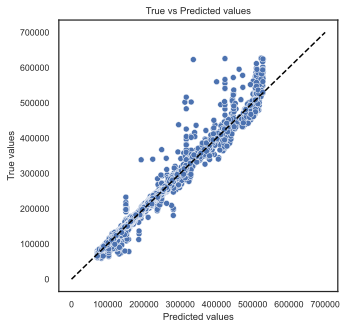

In [49]:
rf_model = RandomForestRegressor(criterion='mse',
                                 max_depth=30, # глубина дерева  
                                 min_samples_leaf=30, # минимальное кол-во наблюдений в листе дерева
                                 random_state=42,
                                 n_estimators=200  # кол-во деревьев
                                 )

rf_model.fit(X_train.loc[:, feature_names], y_train)
y_train_preds = rf_model.predict(X_train.loc[:, feature_names])
evaluate_preds(y_train, y_train_preds)

R2:	0.966
RMSE:	17214.504
MSE:	296339147.261


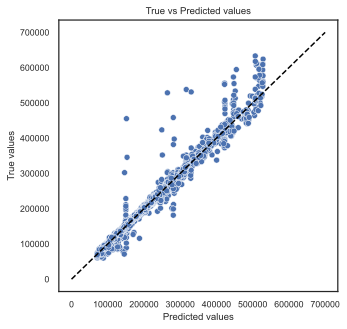

In [50]:
y_test_preds = rf_model.predict(X_test.loc[:, feature_names])
evaluate_preds(y_test, y_test_preds)

results_all['Случайный лес'] = [round(r2(y_test, y_test_preds), 3), round(np.sqrt(mse(y_test, y_test_preds)), 0)]

### 4.6  Gradient Boosting (на регрессии)  <a class='anchor' id='boost'>

In [51]:
gradient_boosting_regressor_model = GradientBoostingRegressor()
gradient_boosting_regressor_model.fit(X_train.loc[:, feature_names], y_train)

GradientBoostingRegressor()

In [52]:
GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=7,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

GradientBoostingRegressor(max_depth=7, presort='auto')

R2:	0.997
RMSE:	4697.075
MSE:	22062509.546


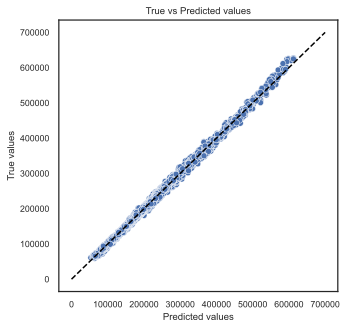

In [53]:
y_train_preds = gradient_boosting_regressor_model.predict(X_train.loc[:, feature_names])
evaluate_preds(y_train, y_train_preds)



R2:	0.993
RMSE:	7593.595
MSE:	57662691.112


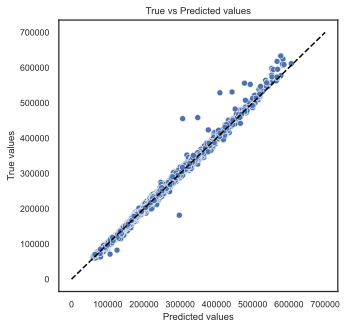

In [54]:
y_test_preds = gradient_boosting_regressor_model.predict(X_test.loc[:, feature_names])
evaluate_preds(y_test, y_test_preds)

results_all['Gradient Boosting'] = [round(r2(y_test, y_test_preds), 3), round(np.sqrt(mse(y_test, y_test_preds)), 0)]

Также еще была рассмотрена SVR модель, однако ее результаты показали меньший R2. 


### 4.7 LGBMRegressor  <a class='anchor' id='LGBMR'>

In [55]:
lgbm_regressor_model = LGBMRegressor()
lgbm_regressor_model.fit(X_train.loc[:, feature_names], y_train)

LGBMRegressor()

In [56]:
LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

LGBMRegressor()

R2:	0.998
RMSE:	4259.543
MSE:	18143702.506


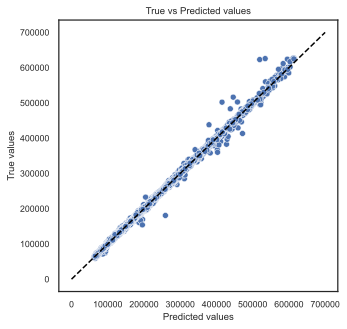

In [57]:
y_train_preds = lgbm_regressor_model.predict(X_train.loc[:, feature_names])
evaluate_preds(y_train, y_train_preds)



R2:	0.992
RMSE:	8362.01
MSE:	69923218.969


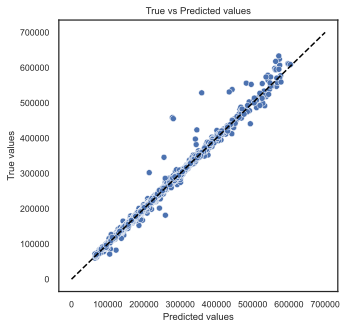

In [58]:
y_test_preds = lgbm_regressor_model.predict(X_test.loc[:, feature_names])
evaluate_preds(y_test, y_test_preds)

results_all['LGBMR'] = [round(r2(y_test, y_test_preds), 3), round(np.sqrt(mse(y_test, y_test_preds)), 0)]

### 4.8 XGBRegressor  <a class='anchor' id='XGBR'>

In [59]:
xgboost_model = XGBRegressor()

In [60]:
XGBRegressor(boosting_type='gbdt', num_leaves=31, max_depth=- 1, learning_rate=0.1, n_estimators=100, subsample_for_bin=200000, objective=None, class_weight=None, min_split_gain=0.0, min_child_weight=0.001, min_child_samples=20, subsample=1.0, subsample_freq=0, colsample_bytree=1.0, reg_alpha=0.0, reg_lambda=0.0, random_state=None, n_jobs=- 1, silent=True, importance_type='split')

XGBRegressor(base_score=None, booster=None, boosting_type='gbdt',
             class_weight=None, colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=1.0, gamma=None, gpu_id=None,
             importance_type='split', interaction_constraints=None,
             learning_rate=0.1, max_delta_step=None, max_depth=-1,
             min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
             missing=nan, monotone_constraints=None, n_estimators=100,
             n_jobs=-1, num_leaves=31, num_parallel_tree=None, objective=None,
             random_state=None, reg_alpha=0.0, reg_lambda=0.0,
             scale_pos_weight=None, silent=True, subsample=1.0, ...)

In [61]:
xgboost_model.fit(X_train.loc[:, feature_names], y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

R2:	1.0
RMSE:	1639.447
MSE:	2687786.452


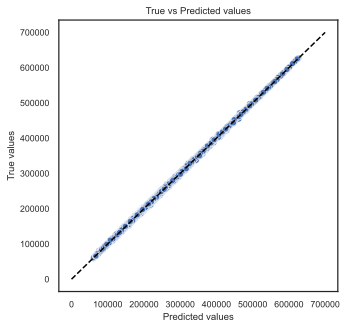

In [62]:
y_train_preds = xgboost_model.predict(X_train.loc[:, feature_names])
evaluate_preds(y_train, y_train_preds)

R2:	0.992
RMSE:	8362.01
MSE:	69923218.969


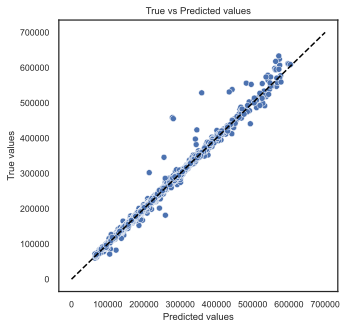

In [63]:
y_test_preds = lgbm_regressor_model.predict(X_test.loc[:, feature_names])
evaluate_preds(y_test, y_test_preds)

results_all['XGBR'] = [round(r2(y_test, y_test_preds), 3), round(np.sqrt(mse(y_test, y_test_preds)), 0)]

## 4.9 Выбор лучшей модели<a class='anchor' id='choose'>

Фактически все модели показали отличные результаты, однако модели бустинга оказались лучше. В качестве итоговой модели будем использовать Gradient Boosting.

In [64]:
df = pd.DataFrame(results_all).T
df.columns=['R2', 'MSE']

df

,R2,MSE
Линейная регрессия,0.892,30473.0
Случайный лес,0.966,17215.0
Gradient Boosting,0.993,7594.0
LGBMR,0.992,8362.0
XGBR,0.992,8362.0


**Кроссвалидация**

In [65]:
cv_score = cross_val_score(gradient_boosting_regressor_model, X_train, y_train, scoring='r2', cv=KFold(n_splits=3, shuffle=True, random_state=21))
cv_score

array([0.99414431, 0.99618146, 0.99337402])

**Важность признаков**

In [66]:
feature_importances = pd.DataFrame(zip(X_train.columns, gradient_boosting_regressor_model.feature_importances_), 
                                   columns=['feature_name', 'importance'])
pd.options.display.float_format = '{:.4f}'.format
feature_importances.sort_values(by='importance', ascending=False)

,feature_name,importance
12,med_price_by_Sq,0.5244
1,Rooms,0.4453
0,const,0.0268
11,DistrictSize,0.0030
13,av_price_by_sq,0.0004
9,Shops_1,0.0000
7,Social_1,0.0000
10,year_cat,0.0000
6,Ecology_1,0.0000
5,ProcFloor,0.0000


# 5. Прогнозирование<a class='anchor' id='estimate'>

## 5.1 Обработка данных<a class='anchor' id='est_ev'>

In [67]:
test = pd.read_csv('test.csv', sep=',')

test = reduce_mem_usage(test)

test = DataPreprocessing().transform(test)

test.describe()

Memory usage of dataframe is: 0.72 MB
Memory usage after optimization is: 0.21 MB
Decreased by 70.3%


,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,An_Life_Sq,Floor_corr
count,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000
mean,8412.5954,51.2792,1.9078,56.4985,37.4888,5.3651,7.8380,13.3950,1984.3926,0.1199,24.9338,5406.9000,8.2626,1029.3964,1.3194,4.2428,13.6446,7.8380
std,4832.6740,44.1795,0.8096,19.0062,15.7272,4.0467,5.4550,6.2319,18.5731,0.1201,17.5322,4026.6148,23.8638,766.5900,1.4799,4.7774,8.6043,5.4550
min,1.0000,0.0000,1.0000,13.3000,8.6000,0.0000,0.0000,1.0000,1908.0000,0.0000,0.0000,168.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,4221.7500,21.0000,1.0000,41.9000,25.6000,1.0000,4.0000,9.0000,1973.0000,0.0195,6.0000,1564.0000,0.0000,810.0000,0.0000,1.0000,8.6000,4.0000
50%,8320.5000,37.0000,2.0000,52.9000,34.2000,6.0000,7.0000,14.0000,1977.0000,0.0722,25.0000,5285.0000,2.0000,900.0000,1.0000,3.0000,12.9000,7.0000
75%,12598.2500,77.0000,2.0000,66.3000,45.6000,8.0000,11.0000,17.0000,2000.0000,0.1958,36.0000,7287.0000,5.0000,990.0000,2.0000,6.0000,18.3000,11.0000
max,16795.0000,212.0000,6.0000,223.5000,168.7000,42.0000,46.0000,99.0000,2020.0000,0.5219,74.0000,19083.0000,141.0000,4849.0000,6.0000,23.0000,103.4000,46.0000


In [68]:
test = fix_binar(test)
test = year_to_cat(test)
test = av_sr(test)
test = new_features(test)

In [69]:
test.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,An_Life_Sq,Floor_corr,year_cat,av_sr,ProcFloor,DistrictSize,med_price_by_Sq,med_price_by_Distr,av_price_by_sq,room_avg
count,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,...,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,5000.0000,4992.0000,5000.0000,5000.0000
mean,8412.5954,51.2792,1.9078,56.4985,37.4888,5.3651,7.8380,13.3950,1984.3926,0.1199,...,13.6446,7.8380,5.4940,2.7774,0.5935,115.5372,3836.1919,3946.2417,3890.3220,32.1846
std,4832.6740,44.1795,0.8096,19.0062,15.7272,4.0467,5.4550,6.2319,18.5731,0.1201,...,8.6043,5.4550,1.8292,0.8782,0.2929,127.3819,519.6516,1656.0961,1245.6565,9.7585
min,1.0000,0.0000,1.0000,13.3000,8.6000,0.0000,0.0000,1.0000,1908.0000,0.0000,...,0.0000,0.0000,1.0000,1.0000,0.0000,1.0000,1620.1720,654.0109,752.7253,9.4800
25%,4221.7500,21.0000,1.0000,41.9000,25.6000,1.0000,4.0000,9.0000,1973.0000,0.0195,...,8.6000,4.0000,4.0000,2.0000,0.3500,27.0000,3481.9626,2781.0657,2909.3320,25.4000
50%,8320.5000,37.0000,2.0000,52.9000,34.2000,6.0000,7.0000,14.0000,1977.0000,0.0722,...,12.9000,7.0000,5.0000,3.0000,0.6200,49.0000,3747.5354,3751.3403,3908.4353,30.8000
75%,12598.2500,77.0000,2.0000,66.3000,45.6000,8.0000,11.0000,17.0000,2000.0000,0.1958,...,18.3000,11.0000,7.0000,3.0000,0.8500,257.0000,4076.4441,4762.1221,4704.1664,38.4625
max,16795.0000,212.0000,6.0000,223.5000,168.7000,42.0000,46.0000,99.0000,2020.0000,0.5219,...,103.4000,46.0000,9.0000,5.0000,1.0000,391.0000,9332.4219,38708.7070,11325.8877,163.3000


## 5.2 Применение модели и сохранение<a class='anchor' id='est_save'>

In [70]:
test = prep_stand_data(test)

In [71]:
test_features = test[feature_names]

In [72]:
test['Price'] = gradient_boosting_regressor_model.predict(test_features)

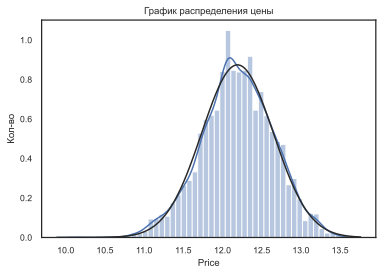

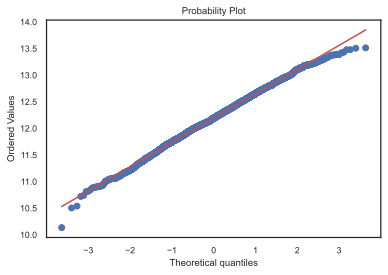

In [73]:
price_log = np.log1p(test['Price'])
sns.distplot(price_log, fit=norm)

plt.ylabel('Кол-во')
plt.title('График распределения цены')

fig = plt.figure()
res = stats.probplot(price_log, plot=plt)
plt.show()


In [74]:
#данные медианы, моды, среднего по ценам на квартиры, проверка на пропуски
data_median = test['Price'].median()
data_mode = test['Price'].mode()[0]
data_mean = round(test['Price'].mean(), 2)
data_row['Price'].isnull().astype(np.int).sum()
print('МИН', test['Price'].min())
print('МАКС', test['Price'].max())
print('МЕДИАНА', test['Price'].median())


МИН 25224.86948543089
МАКС 739104.1667135389
МЕДИАНА 196680.62564647288


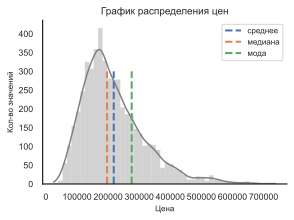

In [75]:
#график распределения цен
sns.set(font_scale=0.8, style='white')
sns.displot(test['Price'], kde=True, color='grey', alpha = 0.35, lw=0, height=3, aspect=1.4)
y = np.linspace(0, 300, 10)
plt.plot([data_mean] * 10, y, label='среднее',  linewidth=2, linestyle='--')
plt.plot([data_median] * 10, y, label='медиана',  linewidth=2, linestyle='--')
plt.plot([data_mode] * 10, y, label='мода',  linewidth=2, linestyle='--')
plt.title('График распределения цен', fontsize=10)
plt.xlabel('Цена', fontsize=8)
plt.ylabel('Кол-во значений', fontsize=8)
plt.legend(fontsize=8)
plt.show()

In [76]:
test[['Id', 'Price']].to_csv('Aberezikov_predictions.csv', index=None)